<center><h1>Effects of Climate Changes on Crop Yields using Machine Learning Techniques</h1></center>
<center><img src="https://eos.com/wp-content/uploads/2020/10/drought-on-the-corn-field.jpg.webp"></center>

## Table of Contents
- [1 - Introduction](#intro)
    - [1.1 Importing Libraries](#il)
- [2 - Data Wrangling](#wrangling)
    - [2.1 - General Properties](#id)
    - [2.2 - Cleaning Data](#cd)
        - [2.2.1 - Remove nulls](#rn)
        - [2.2.2 - Remove Duplicates](#rd)
        - [2.2.3 - Remove Outliers](#ro)
- [3 - Exploratory Data Analysis](#eda)
    - [3.1 - Histogram](#ho)
    - [3.2 - Line Plot](#lp)
    - [3.3 - Bar Plot](#bp)
    - [3.4 - Scatter Plot](#sp)
    - [3.5 - HeatMap](#hm)
- [4 - Building Models](#model)
    - [4.1 - Dimension Reduction](#dr)
    - [4.2 - Spliting Data](#sd)
     - [4.3 - Regression Models](#tm)
        - [4.3.1 - Gradient Boosting Regressor](#gbr)
        - [4.3.2 - Linear Regression](#sgd)
        - [4.3.3 - Ridge Regression](#rid)
        - [4.3.4 - Lasso Regression](#lass)
        - [4.3.5 - Support Vector Regression](#svr)
        - [4.3.6 - Elastic Net](#en)
        - [4.3.7 - Random Forest Regressor](#rfr)
        - [4.3.8 - Extreme Gradient Boosting Regressor](#xgb)
- [5 - Evaluation Models](#em)



In [121]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<a id='intro'></a>
# Introduction
We have a dataset of Climate chane with cropsand we have to analysis and predict the percentage of the produced crop yield

this dataset has 7 columns and 28242 rows .

### the columns consist of:

1. `Area` : Country name.
2. `Item` : Name of the crop.
3. `Year` : The year of planting the plant.
4. `average_rain_fall_mm_per_year` : Average of falling the rain.
5. `pesticides_tonnes` : Insecticide in Tonnes (1000kg).
6. `avg_temp` : The mean of the temperature.
7. `hg/ha_yield`: This is the percentage of the produced crop yield.

<a id='il'></a>
## Importing libraries

In [122]:
#importing Libraries for exploring and Visualize Data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
%matplotlib inline

<a id='wrangling'></a>
# Data Wrangling
In this section we will load data and perform some cleaning for the data finding duplicates and missing value editing the data type of the columns

<a id='id'></a>

### General Properties
Load data and explore it and make some notes for analysis later

In [123]:
# Load data
df=pd.read_csv('/content/drive/MyDrive/RS dataset/climate-ds 1.csv',index_col=0)
df.head()

,Area,Item,Year,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,hg/ha_yield
0,Albania,Maize,1990,1485,121.0,16.37,36613
1,Albania,Potatoes,1990,1485,121.0,16.37,66667
2,Albania,"Rice, paddy",1990,1485,121.0,16.37,23333
3,Albania,Sorghum,1990,1485,121.0,16.37,12500
4,Albania,Soybeans,1990,1485,121.0,16.37,7000


In [124]:
#rows and columns
df.shape

(10576, 7)

In [125]:
#information about data
# check data type of each coulmn
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10576 entries, 0 to 10575
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Area                           10576 non-null  object 
 1   Item                           10576 non-null  object 
 2   Year                           10576 non-null  int64  
 3   average_rain_fall_mm_per_year  10576 non-null  int64  
 4   pesticides_tonnes              10576 non-null  float64
 5   avg_temp                       10576 non-null  float64
 6   hg/ha_yield                    10576 non-null  int64  
dtypes: float64(2), int64(3), object(2)
memory usage: 661.0+ KB


In [126]:
#some statistical information about data
df.describe()

,Year,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,hg/ha_yield
count,10576.000000,10576.000000,10576.000000,10576.000000,10576.000000
mean,2001.477307,1343.711517,55545.470394,19.789051,73617.195537
std,7.082376,761.880900,89336.758931,6.584174,79118.175360
min,1990.000000,51.000000,0.040000,3.690000,578.000000
25%,1995.000000,591.000000,2407.000000,16.840000,21285.000000
50%,2001.000000,1410.000000,15373.000000,20.890000,43386.500000
75%,2008.000000,1761.000000,63700.170000,25.690000,96496.750000
max,2013.000000,3240.000000,367778.000000,29.410000,501412.000000


In [127]:
#Number of unique columns
print(f"Area has {df.Area.nunique()} unique value\nThere names :\n{df.Area.unique().tolist()}")

Area has 43 unique value
There names :
['Albania', 'Algeria', 'Angola', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Belarus', 'Belgium', 'Botswana', 'Brazil', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cameroon', 'Canada', 'Central African Republic', 'Chile', 'Colombia', 'Croatia', 'Denmark', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Eritrea', 'Estonia', 'Finland', 'France', 'Germany', 'Ghana', 'Greece', 'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Honduras', 'Hungary', 'India']


In [128]:
#Number of unique columns
print(f"Area has {df.Item.nunique()} unique value\nThere names :\n{df.Item.unique().tolist()}")

Area has 10 unique value
There names :
['Maize', 'Potatoes', 'Rice, paddy', 'Sorghum', 'Soybeans', 'Wheat', 'Cassava', 'Sweet potatoes', 'Plantains and others', 'Yams']


<a id='cd'></a>

## Data Cleaning
i'm going to clean my data, to ensure that the data if ready for my analysis.

In [129]:
#check null values
df.isnull().sum()

Area                             0
Item                             0
Year                             0
average_rain_fall_mm_per_year    0
pesticides_tonnes                0
avg_temp                         0
hg/ha_yield                      0
dtype: int64

<a id='rn'></a>


In [130]:
#confirmation of data is clean from
df.isnull().sum().any()

False

In [131]:
#Number of 0 values
for column_name in df.columns:
    column = df[column_name]
    # Get the count of Zeros in column
    count = (column == 0).sum()
    print('Count of zeros in column ', column_name, ' is : ', count)

Count of zeros in column  Area  is :  0
Count of zeros in column  Item  is :  0
Count of zeros in column  Year  is :  0
Count of zeros in column  average_rain_fall_mm_per_year  is :  0
Count of zeros in column  pesticides_tonnes  is :  0
Count of zeros in column  avg_temp  is :  0
Count of zeros in column  hg/ha_yield  is :  0


- Note:
 There is null values in form of 0 value in the integer and float datatype.
 it may be wrong values or it is correct depend on the column as `0 in the year column is null value`
 But in another columns like `hg/ha_yield`  is a valued number

<a id='rd'></a>

## Remove Duplicates

In [132]:
#check Duplicates
df.duplicated().sum()

582

In [133]:
#remove Duplicates
df.drop_duplicates(keep='first',inplace = True)
df.duplicated().sum()

0

<a id='ro'></a>

## Remove Outliers

In [134]:
# View the index number and label for each column
for x, y in enumerate(df.columns):
    print(x, y)

0 Area
1 Item
2 Year
3 average_rain_fall_mm_per_year
4 pesticides_tonnes
5 avg_temp
6 hg/ha_yield


In [135]:
def hist_box():
    for i in df.columns[3:]:
        plt.subplots(nrows=1,ncols=2,figsize=(15,6))
        plt.subplot(1,2,1)
        plt.hist(df[i])
        plt.title(i);
        plt.subplot(1,2,2)
        sns.boxplot(data=df[i])
        plt.title(i);
        yield()

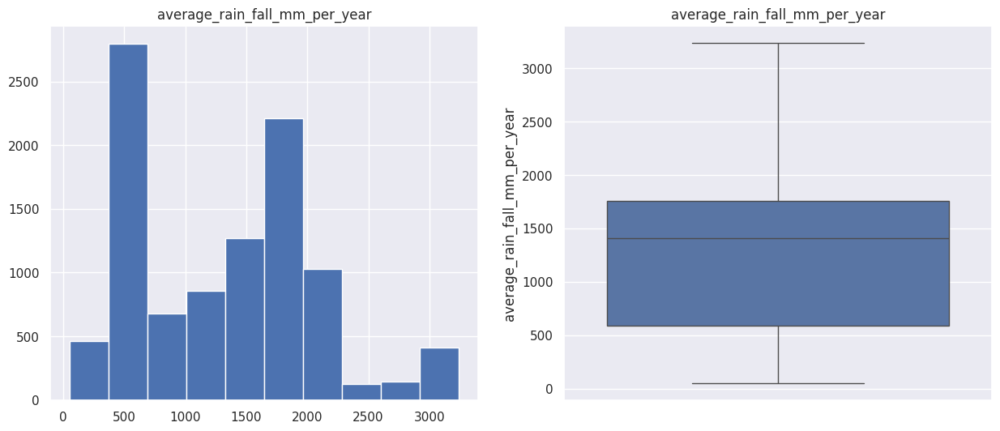

In [136]:
hibox = hist_box()
next(hibox);

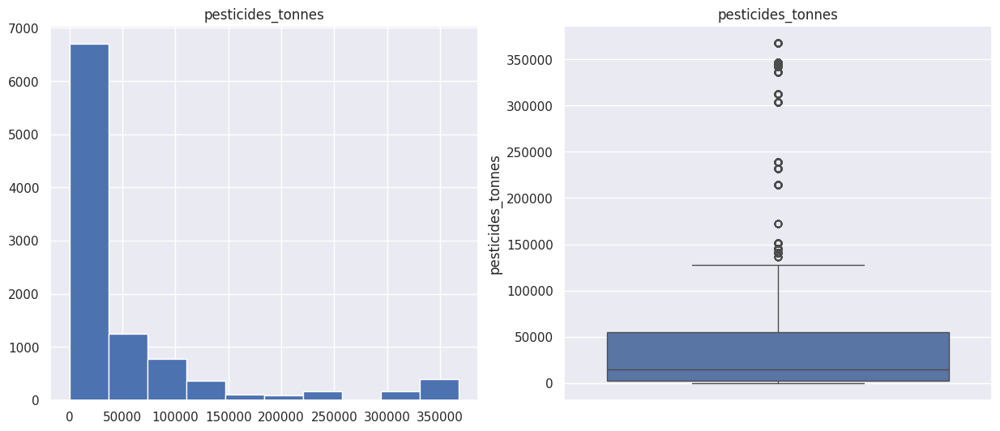

In [137]:
next(hibox);

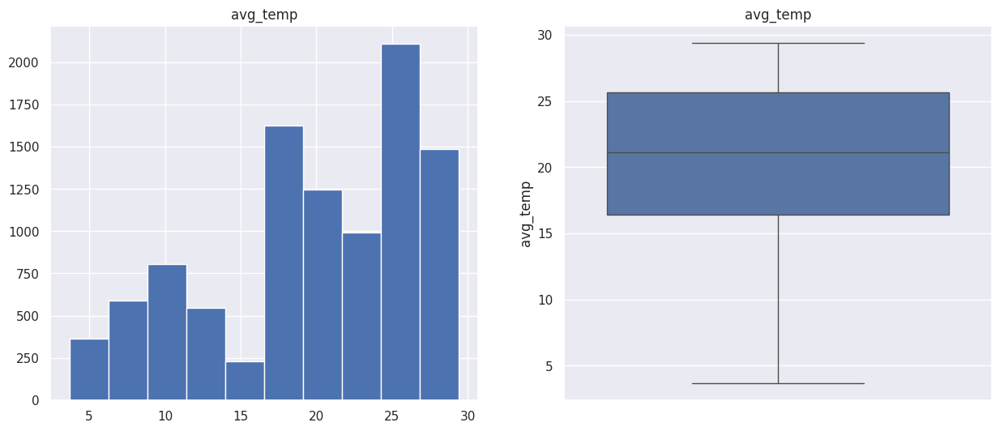

In [138]:
next(hibox);

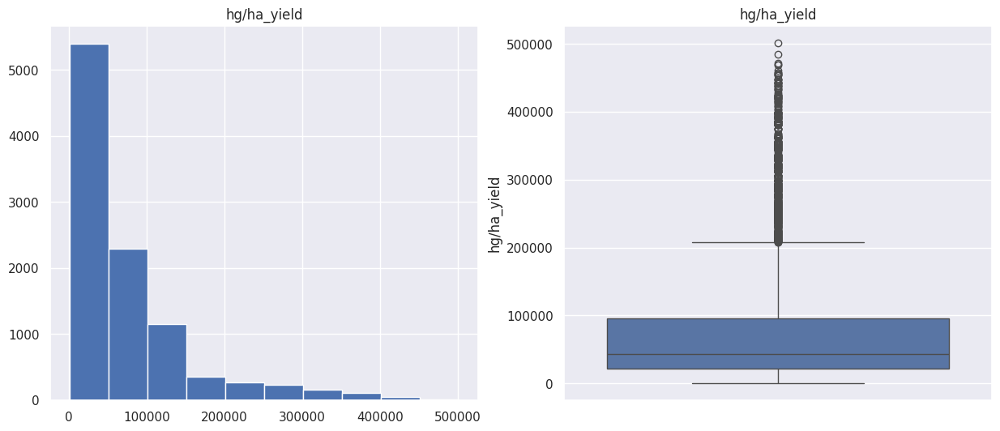

In [139]:
next(hibox);

In [140]:
q_hi  = df["hg/ha_yield"].quantile(0.90)
#clear outliers
df[(df["hg/ha_yield"] < q_hi)]

,Area,Item,Year,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,hg/ha_yield
0,Albania,Maize,1990,1485,121.0,16.37,36613
1,Albania,Potatoes,1990,1485,121.0,16.37,66667
2,Albania,"Rice, paddy",1990,1485,121.0,16.37,23333
3,Albania,Sorghum,1990,1485,121.0,16.37,12500
4,Albania,Soybeans,1990,1485,121.0,16.37,7000
...,...,...,...,...,...,...,...
10571,India,"Rice, paddy",1990,1083,75000.0,24.10,26125
10572,India,"Rice, paddy",1990,1083,75000.0,25.25,26125
10573,India,"Rice, paddy",1990,1083,75000.0,25.44,26125
10574,India,"Rice, paddy",1990,1083,75000.0,25.54,26125


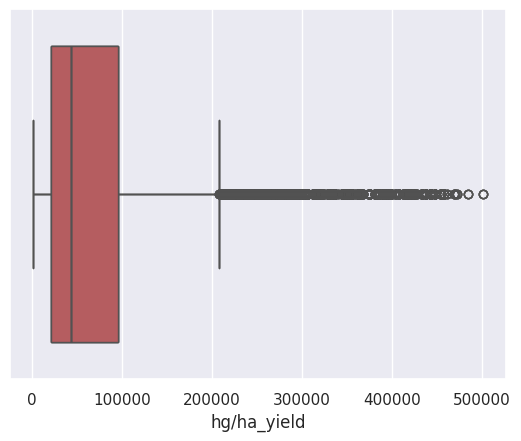

In [141]:
sns.set()
#check outliers
for i in df.columns[3:]:
    sns.boxplot(data = df , x = df["hg/ha_yield"]);

<a id='eda'></a>

# Exploratory Data Analysis
In this section we will try to Visualize and get insights from the Data

 <a id='ho'></a>
## Histogram

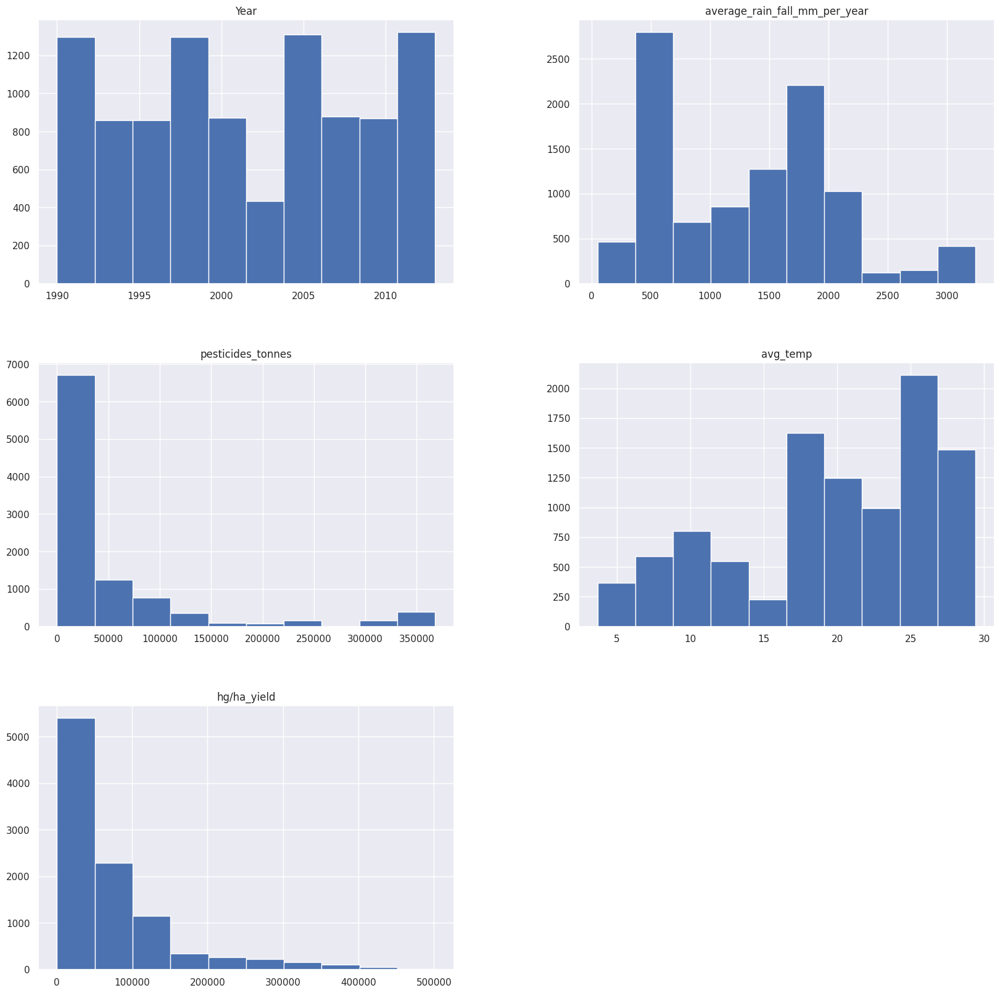

In [142]:
sns.set()
df.hist(figsize=(20,20));

 <a id='lp'></a>
## line Plot
In this chart we will try to understand the effect of time with climate and crop produce

In [143]:
#Store the numerical columns name in a variable
continuouscols = df.columns[2:].tolist()
#Make Function to plot year with repeat code
def yearPlot():
    for i in continuouscols[1:]:
        plt.figure(figsize=(20,5))
        sns.lineplot(data=df.groupby(['Year']).mean()[i])
        plt.xlabel('Year',fontsize = 15)
        plt.ylabel(i, fontsize = 15)
        plt.title(f"Effect of Year on the {i}", fontsize = 25)
        yield()

<ipython-input-143-b4dc6fc80c87>:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.lineplot(data=df.groupby(['Year']).mean()[i])


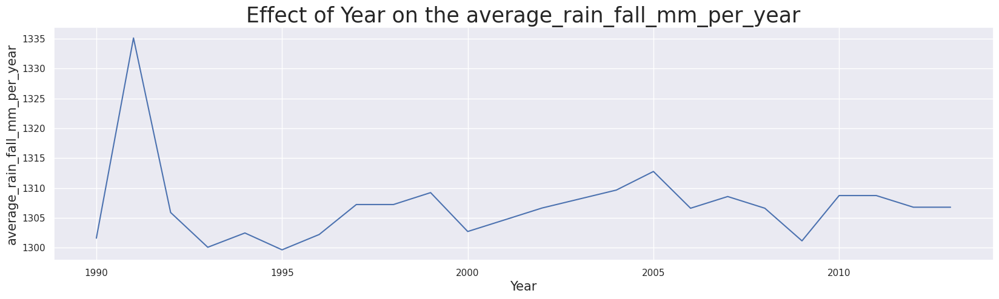

In [144]:
yplot = yearPlot()
next(yplot);

<ipython-input-143-b4dc6fc80c87>:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.lineplot(data=df.groupby(['Year']).mean()[i])


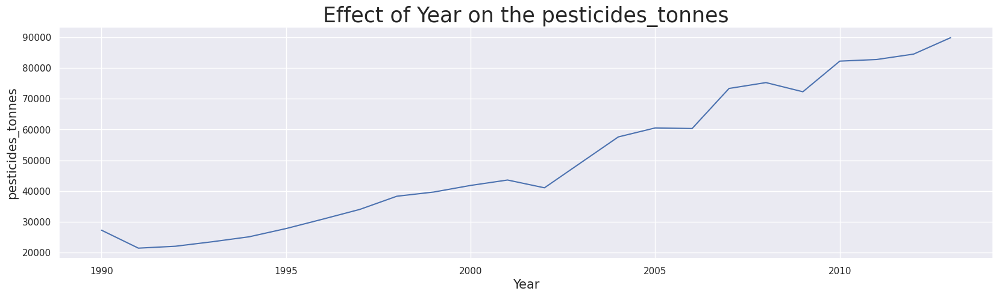

In [145]:
next(yplot);

<ipython-input-143-b4dc6fc80c87>:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.lineplot(data=df.groupby(['Year']).mean()[i])


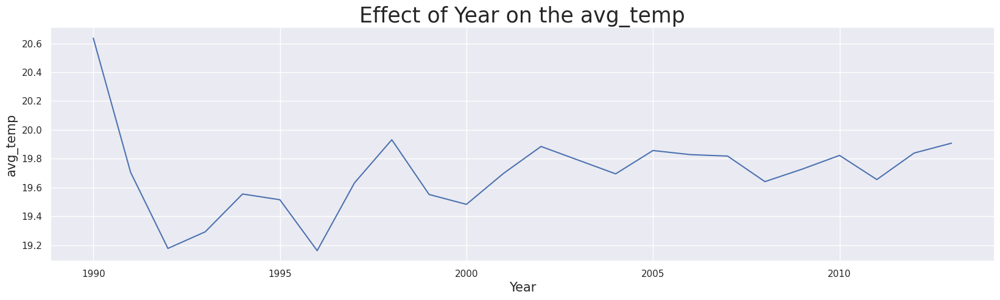

In [146]:
next(yplot);

<ipython-input-143-b4dc6fc80c87>:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.lineplot(data=df.groupby(['Year']).mean()[i])


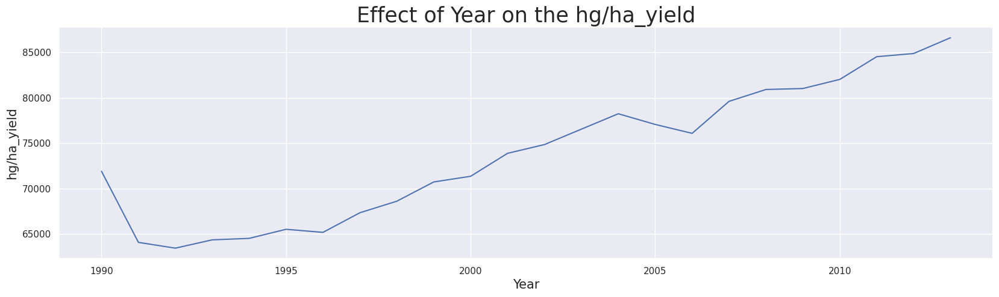

In [147]:
next(yplot);

 <a id='bp'></a>

## Bar Plot
In this chart we will try to understand the relation between type of the crop and production

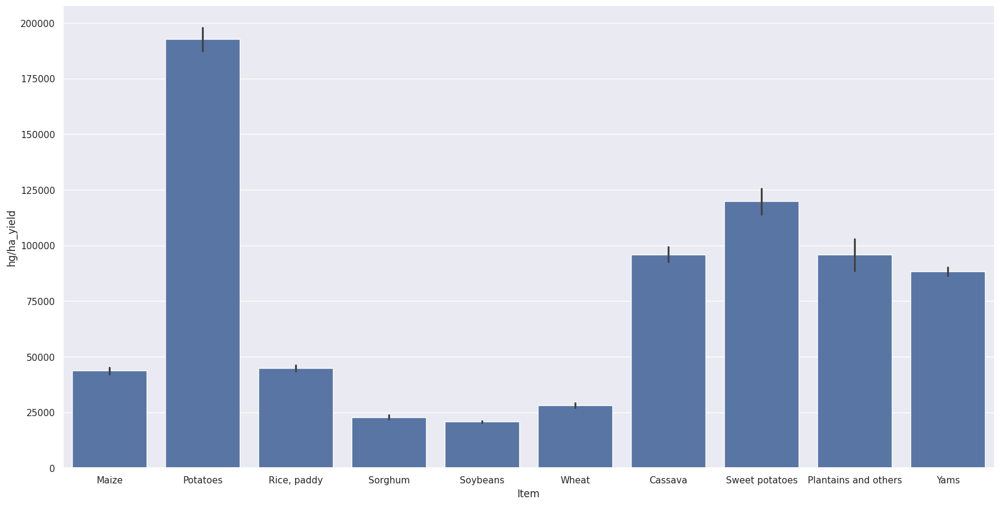

In [148]:
#visualization of Items with hg/ha_yield
sns.set()
plt.figure(figsize=(20,10))
sns.barplot(data=df, x = df.Item, y = df['hg/ha_yield'])
plt.show()

In [149]:
#group Area with Hg/Ha_Yield sum
ST_df=df.groupby(df.Area)[['hg/ha_yield']].sum()
ST_df

,hg/ha_yield
Area,
Albania,5711536
Algeria,6711464
Angola,5722563
Argentina,32864032
Armenia,4524100
Australia,109111062
Austria,10852258
Azerbaijan,4608380
Bahamas,4384717


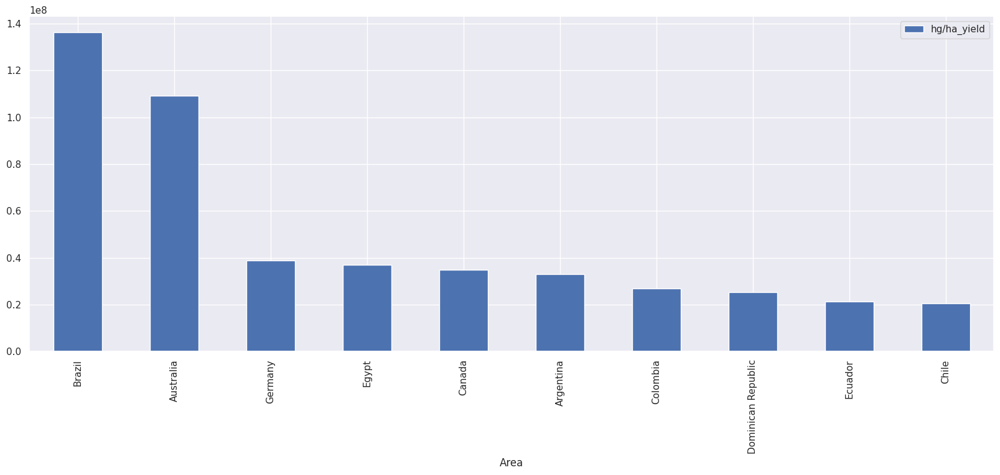

In [150]:
#Area with the sum of Hg/Ha_yield
d10 = ST_df.nlargest(10, 'hg/ha_yield')
T10 = d10.loc[:,['hg/ha_yield']].head(10)
#Visualize bar plot
sns.set()
T10.plot.bar(figsize=(20,7));

 <a id='sp'></a>
## Scatter Plot
In this section find the correlation between the features and output

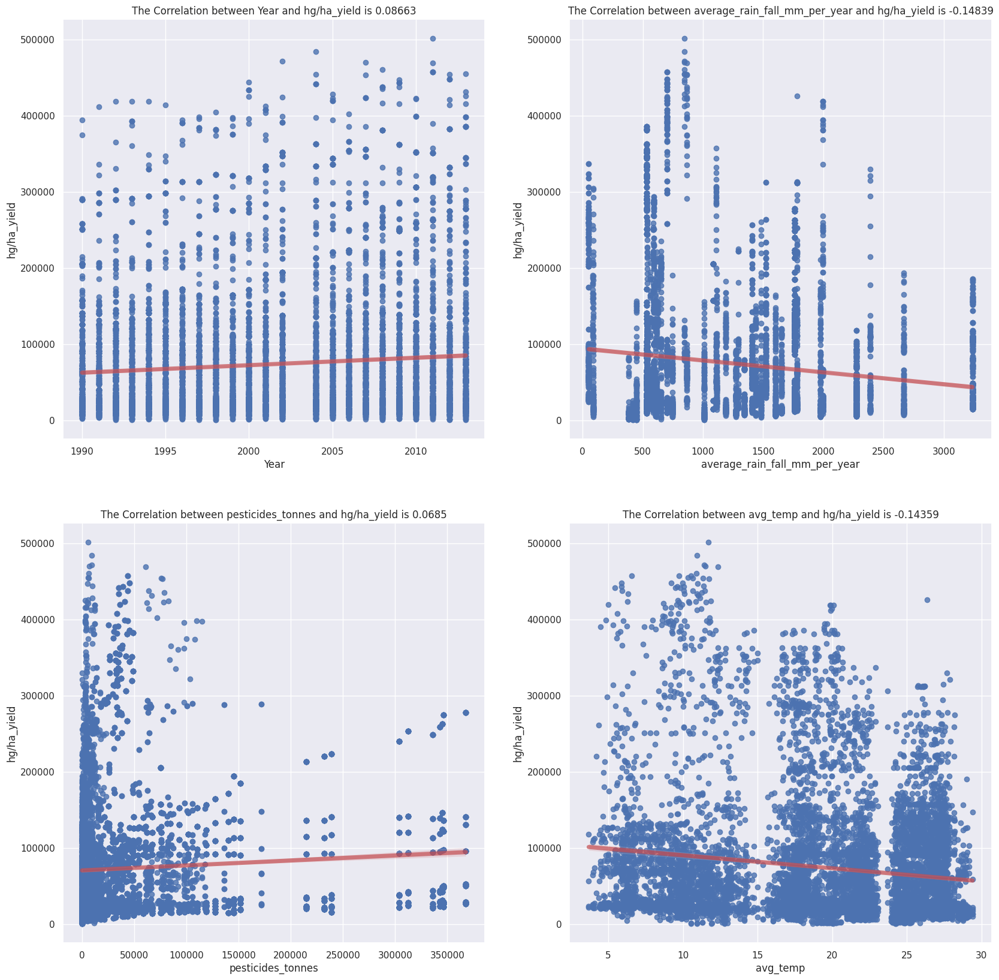

In [151]:
#make subplot for 4 plots
fig,plotcanvas=plt.subplots(nrows=2,ncols=2,figsize=(20,20))
#Store the numerical columns name in a variable
continuouscols = df.columns[2:].tolist()
#make for loop to iterate over all columns
for i in range(0,len(continuouscols)-1):
    x = 0 if ((i == 0) or (i == 1)) else  1
    y = 0 if ((i == 0) or (i == 2)) else  1
    #make scatterplot with regression line
    sns.regplot(data = df, x = continuouscols[i], y = 'hg/ha_yield', line_kws={"color":"r","alpha":0.7,"lw":5}, ax=plotcanvas[x,y])
    #find correlation between this two columns
    cor = round(df['hg/ha_yield'].corr(df[continuouscols[i]]),5)
    #put title for this plot
    plotcanvas[x , y].set_title(f'The Correlation between {continuouscols[i]} and hg/ha_yield is {cor}')

 <a id='hm'></a>
## HeatMap

<ipython-input-152-694dc8b3f5d2>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True)


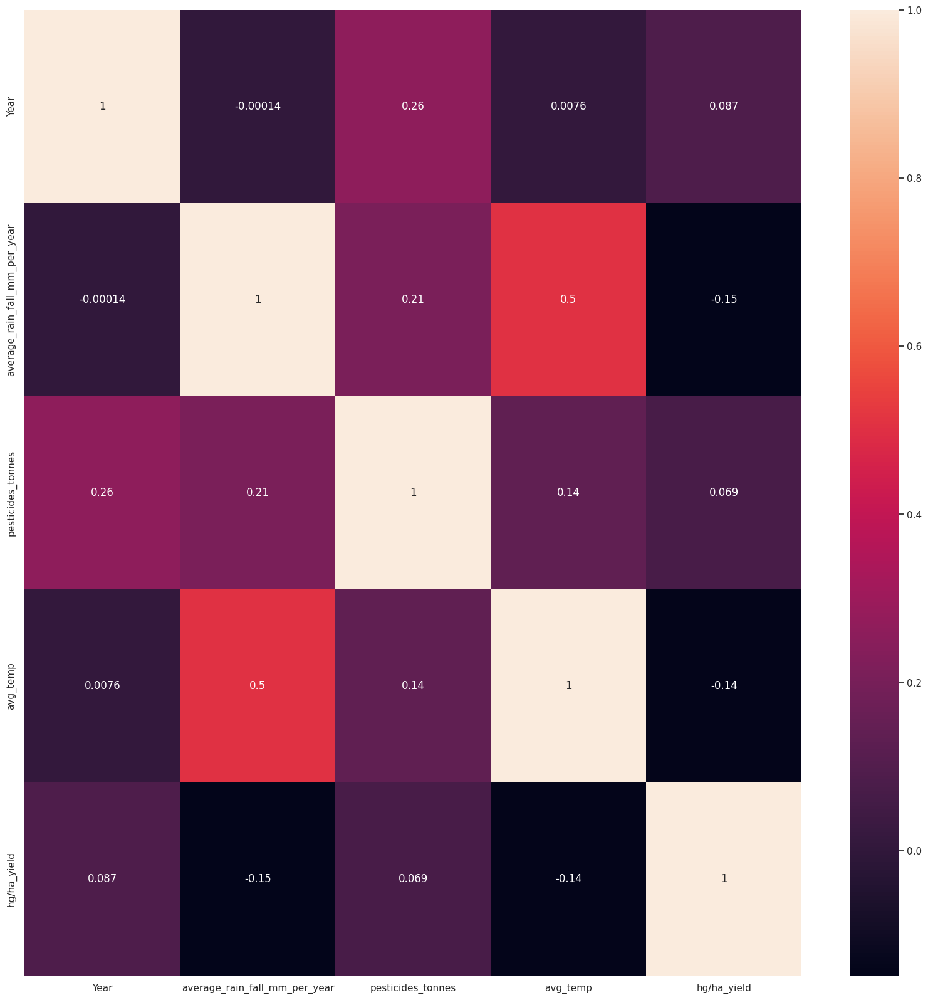

In [152]:
#making heatmap for all data
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True)
plt.show()

In [153]:
df.describe()

,Year,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,hg/ha_yield
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,2001.479888,1306.913348,50430.714113,19.700324,73857.769061
std,7.075231,761.408043,84121.173237,6.717110,80063.154249
min,1990.000000,51.000000,0.040000,3.690000,578.000000
25%,1995.000000,591.000000,2084.382500,16.430000,21244.000000
50%,2001.000000,1410.000000,14798.280000,21.150000,43667.000000
75%,2008.000000,1761.000000,54595.000000,25.690000,95930.000000
max,2013.000000,3240.000000,367778.000000,29.410000,501412.000000


## One Hot Encoding

In [154]:
#one hot encoding for the categorical columns to can be trained in the model
df = pd.get_dummies(df,columns=['Area','Item'])
df.rename(columns={x:x[5:] for x in df.columns[6:]}, inplace = True)
df.head(10)

,Year,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,hg/ha_yield,Area_Albania,Algeria,Angola,Argentina,Armenia,...,Cassava,Maize,Plantains and others,Potatoes,"Rice, paddy",Sorghum,Soybeans,Sweet potatoes,Wheat,Yams
0,1990,1485,121.0,16.37,36613,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,1990,1485,121.0,16.37,66667,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,1990,1485,121.0,16.37,23333,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1990,1485,121.0,16.37,12500,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,1990,1485,121.0,16.37,7000,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,1990,1485,121.0,16.37,30197,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,1991,1485,121.0,15.36,29068,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,1991,1485,121.0,15.36,77818,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,1991,1485,121.0,15.36,28538,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,1991,1485,121.0,15.36,6667,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [155]:
#split the data from the target data
x = df.drop(labels=['hg/ha_yield'], axis=1)
y = df['hg/ha_yield']

In [156]:
y.describe()

count      9994.000000
mean      73857.769061
std       80063.154249
min         578.000000
25%       21244.000000
50%       43667.000000
75%       95930.000000
max      501412.000000
Name: hg/ha_yield, dtype: float64

<a id='dr'></a>
## Dimension Reduction

In [157]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

x = scaler.fit_transform(x)

<a id='sd'></a>

## Spliting Data

In [158]:
#split data to x_train, x_test, y_train, y_test
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=40,shuffle=True)

In [159]:
#clear memory
del df
del x
del y

In [160]:
#Shape of the data
print('Shape of the x_train data : ', x_train.shape)
print('Shape of the y_train data : ', y_train.shape)
print('Shape of the x_test data : ', x_test.shape)
print('Shape of the y_test data : ', y_test.shape)

Shape of the x_train data :  (6995, 57)
Shape of the y_train data :  (6995,)
Shape of the x_test data :  (2999, 57)
Shape of the y_test data :  (2999,)


In [161]:
#Make DataFrame for track model accuracy
df_models = pd.DataFrame(columns=["Model", "MAE","MEDAE","MSE","RMSE", "Max Error","R2 Score","EVS","MAPE"])

### Evaluation Function

In [162]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, max_error, median_absolute_error, r2_score, explained_variance_score, mean_absolute_percentage_error
import numpy as np
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
#Evaluation function for regression models
def regression_report(y_true, y_pred):

    error = y_true - y_pred

    #Evaluation matrics
    mae = mean_absolute_error(y_true, y_pred)
    medae = median_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    maxerr = max_error(y_true, y_pred)
    r_squared = r2_score(y_true, y_pred)
    evs = explained_variance_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    metrics = [
        ('Mean Absolute Error', mae),
        ('Median Absolute Error', medae),
        ('Mean Squared Error', mse),
        ('Root Mean Squared Error', rmse),
        ('Max error', maxerr) ,
        ('R2 score', r_squared),
        ('Explained variance score', evs),
        ('Mean Absolute Percentage Error', mape)
    ]

    print('Regression Report:')
    for metric_name, metric_value in metrics:
        print(f'\t\t\t{metric_name:30s}: {metric_value: >20.3f}')

    return mae, medae, mse, rmse, maxerr, r_squared, evs, mape

<a id='tm'></a>
#  Regression Models

<a id='gbr'></a>
# Gradient Boosting Regressor

In [163]:
import lightgbm as lgb
import scipy as sp
lgbm = lgb.LGBMRegressor(
                             objective='regression',
                             n_jobs=1,
                            )
#dictionary for hyper parameters
param_dist = {'boosting_type': ['gbdt', 'dart', 'rf'],
                    'num_leaves': sp.stats.randint(2, 1001),
                    'subsample_for_bin': sp.stats.randint(10, 1001),
                    'min_split_gain': sp.stats.uniform(0, 5.0),
                    'min_child_weight': sp.stats.uniform(1e-6, 1e-2),
                    'reg_alpha': sp.stats.uniform(0, 1e-2),
                    'reg_lambda': sp.stats.uniform(0, 1e-2),
                    'tree_learner': ['data', 'feature', 'serial', 'voting' ],
                    'application': ['regression_l1', 'regression_l2', 'regression'],
                    'bagging_freq': sp.stats.randint(1, 11),
                    'bagging_fraction': sp.stats.uniform(1e-3, 0.99),
                    'feature_fraction': sp.stats.uniform(1e-3, 0.99),
                    'learning_rate': sp.stats.uniform(1e-6, 0.99),
                    'max_depth': sp.stats.randint(1, 501),
                    'n_estimators': sp.stats.randint(100, 20001),
                 }
rscv = RandomizedSearchCV(
                              estimator=lgbm,
                              param_distributions=param_dist,
                              cv=3,
                              verbose=0
                            )

I used Randomized Search to optimize hyper parameters of the model

In [164]:
rscv.fit(x_train, y_train)

[LightGBM] [Warning] feature_fraction is set=0.438715340265317, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.438715340265317
[LightGBM] [Warning] bagging_fraction is set=0.2700919744839538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2700919744839538
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] Using too small ``bin_construct_sample_cnt`` may encounter unexpected errors and poor accuracy.
[LightGBM] [Warning] feature_fraction is set=0.438715340265317, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.438715340265317
[LightGBM] [Warning] bagging_fraction is set=0.2700919744839538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2700919744839538
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhea

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there ar

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there ar

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there ar

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.16371889559224304, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16371889559224304
[LightGBM] [Warning] bagging_fraction is set=0.5196939179814271, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5196939179814271
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.16371889559224304, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16371889559224304
[LightGBM] [Warning] bagging_fraction is set=0.5196939179814271, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5196939179814271
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.16371889559224304, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16371889559224304
[LightGBM] [Warning] bagging_fraction is set=0.5196939179814271, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5196939179814271
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.7700008885436629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7700008885436629
[LightGBM] [Warning] bagging_fraction is set=0.643404679272637, subsample=1.0 will be ignored. Current value: bagging_fraction=0.643404679272637
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.7700008885436629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7700008885436629
[LightGBM] [Warning] bagging_fraction is set=0.643404679272637, subsample=1.0 will be ignored. Current value: bagging_fraction=0.643404679272637
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.7700008885436629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7700008885436629
[LightGBM] [Warning] bagging_fraction is set=0.643404679272637, subsample=1.0 will be ignored. Current value: bagging_fraction=0.643404679272637
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more le

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.06157440655135914, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.06157440655135914
[LightGBM] [Warning] bagging_fraction is set=0.3143954194914501, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3143954194914501
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.06157440655135914, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.06157440655135914
[LightGBM] [Warning] bagging_fraction is set=0.3143954194914501, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3143954194914501
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.5507173604157346, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5507173604157346
[LightGBM] [Warning] bagging_fraction is set=0.2932453502205427, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2932453502205427
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] Using too small ``bin_construct_sample_cnt`` may encounter unexpected errors and poor accuracy.
[LightGBM] [Warning] feature_fraction is set=0.5507173604157346, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5507173604157346
[LightGBM] [Warning] bagging_fraction is set=0.2932453502205427, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2932453502205427
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the ove

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.481174656778813, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.481174656778813
[LightGBM] [Warning] bagging_fraction is set=0.45961809665466846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.45961809665466846
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.481174656778813, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.481174656778813
[LightGBM] [Warning] bagging_fraction is set=0.45961809665466846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.45961809665466846
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.481174656778813, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.481174656778813
[LightGBM] [Warning] bagging_fraction is set=0.45961809665466846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.45961809665466846
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] Using too small ``bin_construct_sample_cnt`` may encounter unexpected errors and poor accuracy.
[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the ove

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] Using too small ``bin_construct_sample_cnt`` may encounter unexpected errors and poor accuracy.
[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the ove

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] Using too small ``bin_construct_sample_cnt`` may encounter unexpected errors and poor accuracy.
[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the ove

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.9757554778568273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757554778568273
[LightGBM] [Warning] bagging_fraction is set=0.9765592977509359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9765592977509359
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.04425985278465129, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.04425985278465129
[LightGBM] [Warning] bagging_fraction is set=0.4813598619276198, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4813598619276198
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.04425985278465129, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.04425985278465129
[LightGBM] [Warning] bagging_fraction is set=0.4813598619276198, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4813598619276198
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.04425985278465129, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.04425985278465129
[LightGBM] [Warning] bagging_fraction is set=0.4813598619276198, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4813598619276198
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.4165323504245319, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4165323504245319
[LightGBM] [Warning] bagging_fraction is set=0.8802379472924646, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802379472924646
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.4165323504245319, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4165323504245319
[LightGBM] [Warning] bagging_fraction is set=0.8802379472924646, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802379472924646
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.4165323504245319, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4165323504245319
[LightGBM] [Warning] bagging_fraction is set=0.8802379472924646, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802379472924646
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.49437568846620195, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49437568846620195
[LightGBM] [Warning] bagging_fraction is set=0.7011652498274449, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7011652498274449
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.49437568846620195, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49437568846620195
[LightGBM] [Warning] bagging_fraction is set=0.7011652498274449, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7011652498274449
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


[LightGBM] [Warning] feature_fraction is set=0.49437568846620195, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49437568846620195
[LightGBM] [Warning] bagging_fraction is set=0.7011652498274449, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7011652498274449
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

RandomizedSearchCV(cv=3,
                   estimator=LGBMRegressor(n_jobs=1, objective='regression'),
                   param_distributions={'application': ['regression_l1',
                                                        'regression_l2',
                                                        'regression'],
                                        'bagging_fraction': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x77fdd5384490>,
                                        'bagging_freq': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x77fdd5385e1...
                                        'num_leaves': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x77fdd9fc3160>,
                                        'reg_alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x77fdd5387d60>,
                                        'reg_lambda': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x77fdd53862f0>,
                                        'subsample_for_bin': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x77fdd9fc1a20>,
                                        'tree_learner': ['data', 'feature',
                                                         'serial', 'voting']})

In [165]:
print("The best parameters are %s with a score of %0.2f"
      % (rscv.best_params_, rscv.best_score_))
gbr_pred = rscv.predict(x_test)
mae, medae, mse, rmse, maxerr, r_squared, evs, mape = regression_report(y_test, gbr_pred)
row = {"Model": "GBRegressor", "MAE": mae,"MEDAE": medae, "MSE": mse, "RMSE": rmse,
           "Max Error": maxerr, "R2 Score": r_squared, "EVS": evs, "MAPE": mape}
df_models = df_models.append(row, ignore_index=True)

The best parameters are {'application': 'regression', 'bagging_fraction': 0.643404679272637, 'bagging_freq': 10, 'boosting_type': 'dart', 'feature_fraction': 0.7700008885436629, 'learning_rate': 0.6999123196948397, 'max_depth': 162, 'min_child_weight': 0.004087775889070507, 'min_split_gain': 1.6356206531834983, 'n_estimators': 10181, 'num_leaves': 276, 'reg_alpha': 0.002533385102801542, 'reg_lambda': 0.001010344140027275, 'subsample_for_bin': 213, 'tree_learner': 'serial'} with a score of 0.97
[LightGBM] [Warning] feature_fraction is set=0.7700008885436629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7700008885436629
[LightGBM] [Warning] bagging_fraction is set=0.643404679272637, subsample=1.0 will be ignored. Current value: bagging_fraction=0.643404679272637
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:644: UserWarning: Found 'application' in params. Will use it instead of 'objective' argument
  _log_warning(f"Found '{alias}' in params. Will use it instead of 'objective' argument")


Regression Report:
			Mean Absolute Error           :             5329.976
			Median Absolute Error         :             2313.770
			Mean Squared Error            :        128583386.807
			Root Mean Squared Error       :            11339.461
			Max error                     :           169529.679
			R2 score                      :                0.980
			Explained variance score      :                0.980
			Mean Absolute Percentage Error:                0.147


<ipython-input-165-71f3772f8b76>:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_models = df_models.append(row, ignore_index=True)


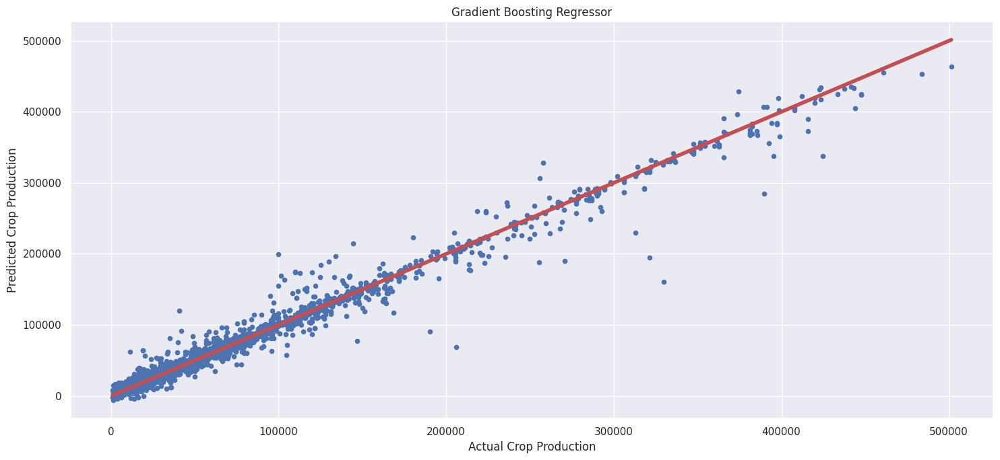

In [166]:
plt.figure(figsize=(15,7))
plt.scatter(y_test, gbr_pred, s=20)
plt.title('Gradient Boosting Regressor')
plt.xlabel('Actual Crop Production')
plt.ylabel('Predicted Crop Production')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
plt.tight_layout()

- Gradient Boosting Regressor Model got a great prediction r2 score equals 0.985 which is very good
- Mean Absolute Error is 5055 that means that the different between actual mean and predicted mean is 5055 which is excellent
- RMSE is 10927 which is very good

<a id='sgd'></a>

# Linear Regression

In [167]:
from sklearn.linear_model import SGDRegressor
param_grid = {
    'learning_rate': ['constant', "optimal", "invscaling", "adaptive" ]
}
sgd = SGDRegressor()
model = GridSearchCV(estimator=sgd, param_grid=param_grid, cv=5,verbose=0)
model.fit(x_train, y_train)
sgd_pred = model.predict(x_test)
mae, medae, mse, rmse, maxerr, r_squared, evs, mape = regression_report(y_test, sgd_pred)
row = {"Model": "SGDRegressor", "MAE": mae,"MEDAE": medae, "MSE": mse, "RMSE": rmse,
           "Max Error": maxerr, "R2 Score": r_squared, "EVS": evs, "MAPE": mape}
df_models = df_models.append(row, ignore_index=True)

Regression Report:
			Mean Absolute Error           :            30592.504
			Median Absolute Error         :            22093.508
			Mean Squared Error            :       1881768526.204
			Root Mean Squared Error       :            43379.356
			Max error                     :           266271.919
			R2 score                      :                0.712
			Explained variance score      :                0.712
			Mean Absolute Percentage Error:                0.977


<ipython-input-167-c46385bfe4d2>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_models = df_models.append(row, ignore_index=True)


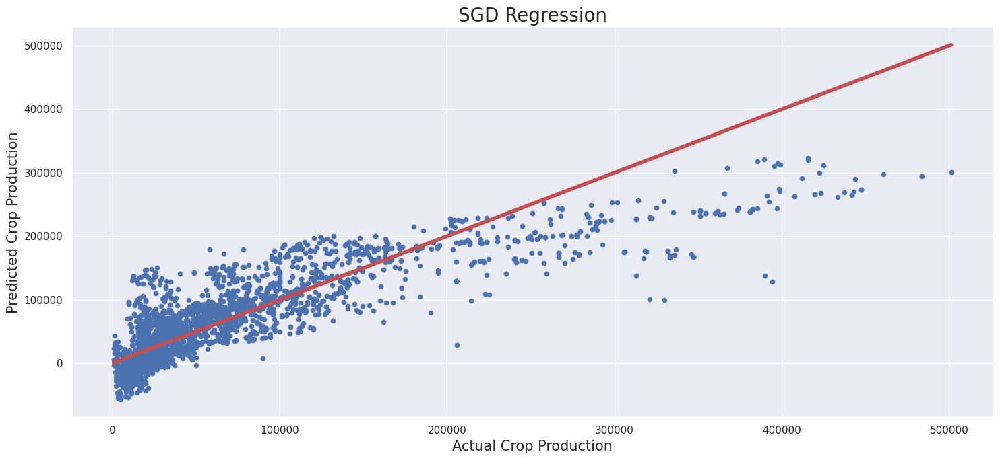

In [168]:
plt.figure(figsize=(15,7))
plt.scatter(y_test, sgd_pred, s=20)
plt.title('SGD Regression',fontsize=20)
plt.xlabel('Actual Crop Production',fontsize=15)
plt.ylabel('Predicted Crop Production',fontsize=15)

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
plt.tight_layout()

- SGD Regressor Model got a great prediction r2 score equals 0.745 which is not good
- Mean Absolute Error is 30145 that means that the different between actual mean and predicted mean is 30145
- RMSE is 43226 which is bad

<a id='rid'></a>

# Ridge Regression

In [169]:
from sklearn.linear_model import Ridge
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1, 2, 3, 4, 5]
}
rid = Ridge()
model = GridSearchCV(estimator=rid, param_grid=param_grid, cv=5, verbose=0)
model.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 2, 3, 4, 5]})

In [170]:
print("The best parameters are %s with a score of %0.2f"
      % (model.best_params_, model.best_score_))
rid_pred = model.predict(x_test)
mae, medae, mse, rmse, maxerr, r_squared, evs, mape = regression_report(y_test, rid_pred)
row = {"Model": "RidgeRegression", "MAE": mae,"MEDAE": medae, "MSE": mse, "RMSE": rmse,
           "Max Error": maxerr, "R2 Score": r_squared, "EVS": evs, "MAPE": mape}
df_models = df_models.append(row, ignore_index=True)

The best parameters are {'alpha': 5} with a score of 0.71
Regression Report:
			Mean Absolute Error           :            30641.469
			Median Absolute Error         :            22327.931
			Mean Squared Error            :       1868465031.088
			Root Mean Squared Error       :            43225.745
			Max error                     :           271043.743
			R2 score                      :                0.714
			Explained variance score      :                0.714
			Mean Absolute Percentage Error:                0.952


<ipython-input-170-7395ff20264c>:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_models = df_models.append(row, ignore_index=True)


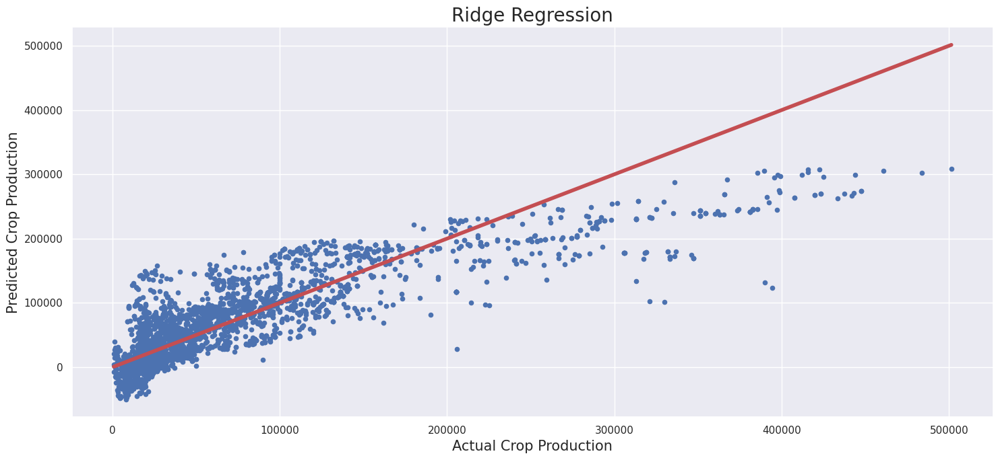

In [171]:
plt.figure(figsize=(15,7))
plt.scatter(y_test, rid_pred, s=20)
plt.title('Ridge Regression',fontsize=20)
plt.xlabel('Actual Crop Production',fontsize=15)
plt.ylabel('Predicted Crop Production',fontsize=15)

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
plt.tight_layout()

- Ridge Regression Model got a great prediction r2 score equals 0.745 which is not good
- Mean Absolute Error is 30142 that means that the different between actual mean and predicted mean is 30142
- RMSE is 43226 which is bad

<a id='lass'></a>

# Lasso Regression

In [172]:
from sklearn.linear_model import Lasso
model = Lasso(alpha= 2, max_iter=10000, tol=0.001)
model.fit(x_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+11, tolerance: 4.445e+10
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=2, max_iter=10000, tol=0.001)

In [173]:
lass_pred = model.predict(x_test)
mae, medae, mse, rmse, maxerr, r_squared, evs, mape = regression_report(y_test, lass_pred)
row = {"Model": "LassoRegression", "MAE": mae,"MEDAE": medae, "MSE": mse, "RMSE": rmse,
           "Max Error": maxerr, "R2 Score": r_squared, "EVS": evs, "MAPE": mape}
df_models = df_models.append(row, ignore_index=True)

Regression Report:
			Mean Absolute Error           :            30649.981
			Median Absolute Error         :            22385.278
			Mean Squared Error            :       1868463812.093
			Root Mean Squared Error       :            43225.731
			Max error                     :           271015.170
			R2 score                      :                0.714
			Explained variance score      :                0.714
			Mean Absolute Percentage Error:                0.953


<ipython-input-173-eb049f9eb54c>:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_models = df_models.append(row, ignore_index=True)


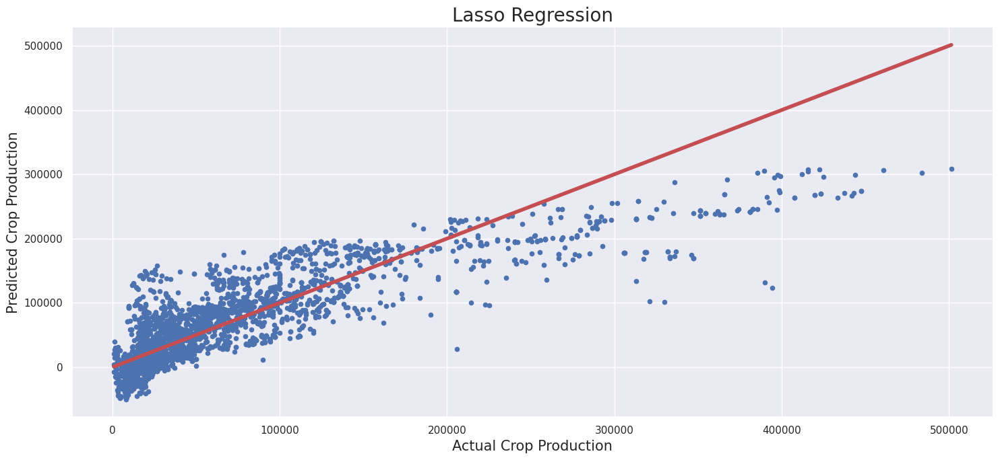

In [174]:
plt.figure(figsize=(15,7))
plt.scatter(y_test, lass_pred, s=20)
plt.title('Lasso Regression',fontsize=20)
plt.xlabel('Actual Crop Production',fontsize=15)
plt.ylabel('Predicted Crop Production',fontsize=15)

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
plt.tight_layout()

- Lasso Regression Model got a great prediction r2 score equals 0.745 which is not good
- Mean Absolute Error is 30142 that means that the different between actual mean and predicted mean is 30142
- RMSE is 43226 which is bad

<a id='svr'></a>

# Support Vector Regression

In [175]:
from sklearn.svm import SVR
param_dist = {
    'kernel' : ['rbf'],
    'C' : sp.stats.randint(1, 10001),
    "epsilon" : sp.stats.uniform(0.00001, 0.99),
    'gamma' : ['scale', 'auto']
}

svr = SVR()
svrcv = RandomizedSearchCV(
                              estimator=svr,
                              param_distributions=param_dist,
                              cv=3,
                              verbose=0
                            )
svrcv.fit(x_train, y_train)

RandomizedSearchCV(cv=3, estimator=SVR(),
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x77fe3fb1ded0>,
                                        'epsilon': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x77fdd83b1180>,
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['rbf']})

In [ ]:
svr_pred = svrcv.predict(x_test)
mae, medae, mse, rmse, maxerr, r_squared, evs, mape = regression_report(y_test, svr_pred)
row = {"Model": "SupportVectorRegressor", "MAE": mae,"MEDAE": medae, "MSE": mse, "RMSE": rmse,
           "Max Error": maxerr, "R2 Score": r_squared, "EVS": evs, "MAPE": mape}
df_models = df_models.append(row, ignore_index=True)

In [ ]:
print("The best parameters are %s with a score of %0.2f"
      % (svrcv.best_params_, svrcv.best_score_))

In [ ]:
plt.figure(figsize=(15,7))
plt.scatter(y_test, svr_pred, s=20)
plt.title('Support Vector Regressor',fontsize=20)
plt.xlabel('Actual Crop Production',fontsize=15)
plt.ylabel('Predicted Crop Production',fontsize=15)

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
plt.tight_layout()

- Support Vector Regressor Model got a great prediction r2 score equals 0.790 which is not good
- Mean Absolute Error is 16370 that means that the different between actual mean and predicted mean is 16370
- RMSE is 39255 which is bad

<a id='en'></a>

# Elastic Net

In [ ]:
from sklearn.linear_model import ElasticNet
model = ElasticNet()
model.fit(x_train, y_train)
en_pred = model.predict(x_test)
mae, medae, mse, rmse, maxerr, r_squared, evs, mape = regression_report(y_test, en_pred)
row = {"Model": "ElasticNet", "MAE": mae,"MEDAE": medae, "MSE": mse, "RMSE": rmse,
           "Max Error": maxerr, "R2 Score": r_squared, "EVS": evs, "MAPE": mape}
df_models = df_models.append(row, ignore_index=True)

In [ ]:
plt.figure(figsize=(15,7))
plt.scatter(y_test, en_pred, s=20)
plt.title('Elastic Net',fontsize=20)
plt.xlabel('Actual Crop Production',fontsize=15)
plt.ylabel('Predicted Crop Production',fontsize=15)

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
plt.tight_layout()

- SGD Regressor Model got a great prediction r2 score equals 0.668 which is bad
- Mean Absolute Error is 31895 that means that the different between actual mean and predicted mean is 31895
- RMSE is 49317 which is bad

<a id='rfr'></a>

# Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
# Create the random grid
random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)],
               'max_features': ['auto', 'sqrt'],
               'max_depth': [int(x) for x in np.linspace(5, 30, num = 6)],
               'min_samples_split': [2, 5, 10, 15, 100],
               'min_samples_leaf': [1, 2, 5, 10],
               'bootstrap' : [True, False]
              }
rfr = RandomForestRegressor()
rfrcv = RandomizedSearchCV(
                              estimator=rfr,
                              param_distributions=random_grid,
                              cv=3,
                              verbose=0
                            )
rfrcv.fit(x_train, y_train)

In [ ]:
print("The best parameters are %s with a score of %0.2f"
      % (rfrcv.best_params_, rfrcv.best_score_))
rfr_pred = rfrcv.predict(x_test)
mae, medae, mse, rmse, maxerr, r_squared, evs, mape = regression_report(y_test, rfr_pred)
row = {"Model": "RandomForestRegressor", "MAE": mae,"MEDAE": medae, "MSE": mse, "RMSE": rmse,
           "Max Error": maxerr, "R2 Score": r_squared, "EVS": evs, "MAPE": mape}
df_models = df_models.append(row, ignore_index=True)

In [ ]:
plt.figure(figsize=(15,7))
plt.scatter(y_test, rfr_pred, s=20)
plt.title('Random Forest Regressor',fontsize=20)
plt.xlabel('Actual Crop Production',fontsize=15)
plt.ylabel('Predicted Crop Production',fontsize=15)

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
plt.tight_layout()

- Random Forest Regressor Model got a great prediction r2 score equals 0.977 which is very good
- Mean Absolute Error is 6043 that means that the different between actual mean and predicted mean is 6043
- RMSE is 12937 which is very good

<a id='xgb'></a>

# Extreme Gradient Boosting Regressor

I will use Bayesian Hyper Parameter optimization in this model
which evaluates the past model information to select hyperparameter values to build the newer model (Conditional probability)

In [ ]:
from xgboost import XGBRegressor
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'learning_rate': hp.loguniform('learning_rate', np.log(0.001), np.log(0.5)),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.uniform('reg_alpha', 0.001, 1.0),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.uniform("n_estimators", 100, 20001)
    }
def objective(space):
    rego=XGBRegressor(
                    n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                    learning_rate = space['learning_rate'], gamma = space['gamma'],
                    reg_alpha = space['reg_alpha'], min_child_weight=int(space['min_child_weight']),
                    reg_lambda = space['reg_lambda'],
                    colsample_bytree=int(space['colsample_bytree']), eval_metric="rmse",
                    early_stopping_rounds=10)

    evaluation = [( x_train, y_train), ( x_test, y_test)]

    rego.fit(x_train, y_train,
            eval_set=evaluation, verbose=0)


    y_pred = rego.predict(x_test)
    r_squared = r2_score(y_test, y_pred)
    return {'loss': -r_squared, 'status': STATUS_OK }

In [ ]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

In [ ]:
best_hyperparams['max_depth'],best_hyperparams['n_estimators'] = int(best_hyperparams['max_depth']),int(best_hyperparams['n_estimators'])

In [187]:
model = XGBRegressor(**best_hyperparams)
model.fit(x_train, y_train)
xgb_pred = model.predict(x_test)
mae, medae, mse, rmse, maxerr, r_squared, evs, mape = regression_report(y_test, xgb_pred)
row = {"Model": "XGBRegressor", "MAE": mae,"MEDAE": medae, "MSE": mse, "RMSE": rmse,
           "Max Error": maxerr, "R2 Score": r_squared, "EVS": evs, "MAPE": mape}
df_models = df_models.append(row, ignore_index=True)

Regression Report:
			Mean Absolute Error           :             5666.367
			Median Absolute Error         :             2618.758
			Mean Squared Error            :        127084867.814
			Root Mean Squared Error       :            11273.192
			Max error                     :           188953.266
			R2 score                      :                0.981
			Explained variance score      :                0.981
			Mean Absolute Percentage Error:                0.157


<ipython-input-187-55706bb5f79a>:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_models = df_models.append(row, ignore_index=True)


In [ ]:
plt.figure(figsize=(15,7))
plt.scatter(y_test, xgb_pred, s=20)
plt.title('XGB Regressor',fontsize=20)
plt.xlabel('Actual Crop Production',fontsize=15)
plt.ylabel('Predicted Crop Production',fontsize=15)

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
plt.tight_layout()

- Extreme Gradient Boosting Regressor Model got a great prediction r2 score equals 0.983 which is very good
- Mean Absolute Error is 6080 that means that the different between actual mean and predicted mean is 6080 which is excellent
- RMSE is 11057 which is very good

<a id='em'></a>

# Evaluation Models

In [ ]:
df_models.sort_values(by="R2 Score")

In [ ]:
plt.figure(figsize=(20,7))
sns.barplot(x=df_models.Model, y=df_models['R2 Score'])
plt.title("Models' and R2 Score", size=15)
plt.xticks(rotation=30, size=12)
plt.show()

In [ ]:
plt.figure(figsize=(20,7))
sns.lineplot(x=df_models.Model, y=df_models.RMSE)
plt.title("Models' and RMSE ", size=15)
plt.xticks(rotation=30, size=12)
plt.show()

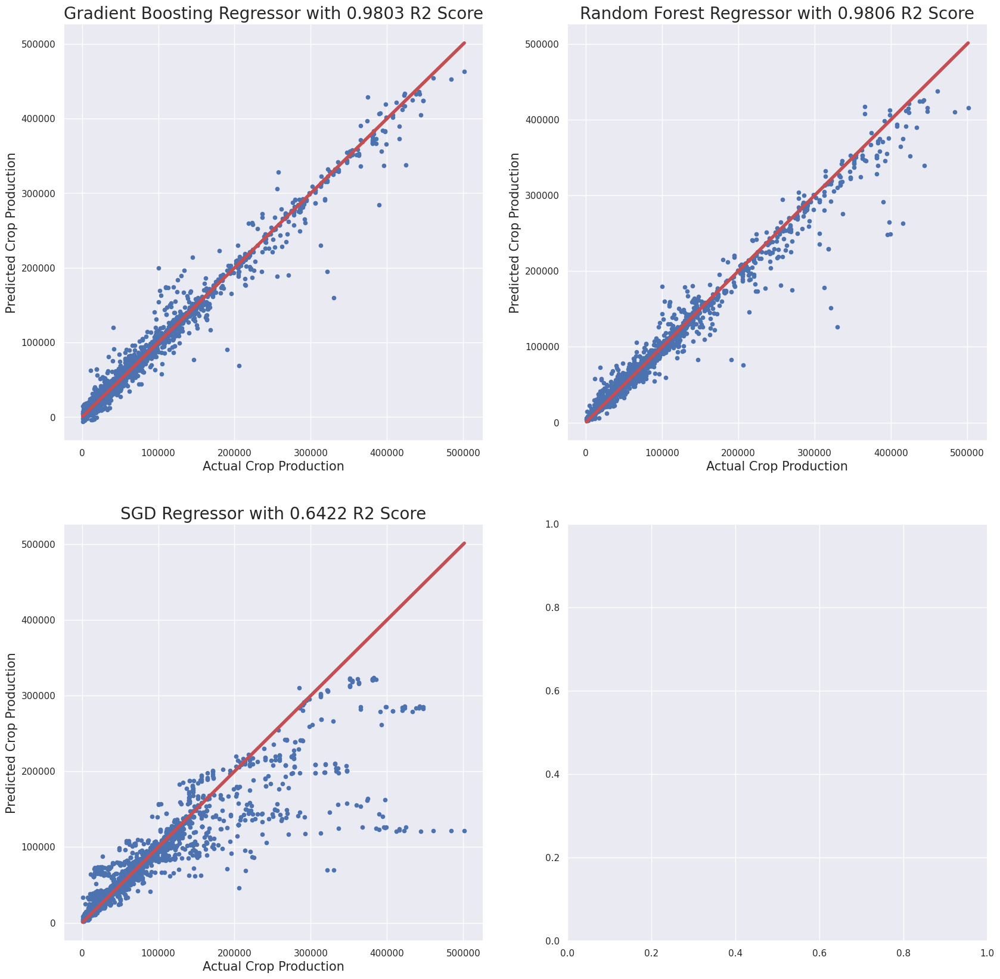

In [192]:
#make subplot for 4 plots
fig,plotcanvas=plt.subplots(nrows=2,ncols=2,figsize=(20,20))
plotcanvas[0, 0].scatter(y_test, gbr_pred, s=20)
c = df_models.loc[0,'R2 Score']
plotcanvas[0, 0].set_title(f'Gradient Boosting Regressor with {c:0.4f} R2 Score',fontsize=20)
plotcanvas[0, 0].set_xlabel('Actual Crop Production',fontsize=15)
plotcanvas[0, 0].set_ylabel('Predicted Crop Production',fontsize=15)
plotcanvas[0, 0].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)


plotcanvas[0, 1].scatter(y_test, rfr_pred, s=20)
c = df_models.loc[7,'R2 Score']
plotcanvas[0, 1].set_title(f'Random Forest Regressor with {c:0.4f} R2 Score',fontsize=20)
plotcanvas[0, 1].set_xlabel('Actual Crop Production',fontsize=15)
plotcanvas[0, 1].set_ylabel('Predicted Crop Production',fontsize=15)
plotcanvas[0, 1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)


plotcanvas[1, 0].scatter(y_test, svr_pred, s=20)
c = df_models.loc[5,'R2 Score']
plotcanvas[1, 0].set_title(f'SGD Regressor with {c:0.4f} R2 Score',fontsize=20)
plotcanvas[1, 0].set_xlabel('Actual Crop Production',fontsize=15)
plotcanvas[1, 0].set_ylabel('Predicted Crop Production',fontsize=15)
plotcanvas[1, 0].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)

# plotcanvas[1, 1].scatter(y_test, xgb_pred , s=20)
# c = df_models.loc[8,'R2 Score']
# plotcanvas[1, 1].set_title(f'XGB Regressor with {c:0.4f} R2 Score',fontsize=20)
# plotcanvas[1, 1].set_xlabel('Actual Crop Production',fontsize=15)
# plotcanvas[1, 1].set_ylabel('Predicted Crop Production',fontsize=15)
# plotcanvas[1, 1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='r', linewidth = 4)
# plt.tight_layout();

- We Can say the top 3 Models are Gradient Boosting Regressor, XGB Regressor, Random Forest Regressor with R2 Score Equals 0.9852, 0.9833, 0.9771 respectively     